<h1> IBM Coursera Capstone Project - The Battle of Neighborhoods

<h4> Explore similar neighborhoods between Manhattan and Seattle <br><br><br>
    Fatih Atalay<br><br>
    05/18/2021

Moving is a very difficult task. Moving to a new city is even harder. Aside from logistics of moving your furniture and belongings, you will start living in a new environment. Adjusting to a new neighborhood may sometimes become difficult.
The neighborhoods we live in have the venues that we shop, eat out, socialize etc. 
When moving to a new neighborhood, having similar venues may help us adjust faster. 
Data science can help us to find a similar neighborhood which has same kind of venues that we are used to.



## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1.  <a href="#item1">Download and Explore Dataset for Manhattan</a>

2.  <a href="#item2">Explore Neighborhoods in New York City</a>

3.  <a href="#item3">Analyze Each Neighborhood</a>

4.  <a href="#item4">Cluster Neighborhoods</a>

5.  <a href="#item5">Examine Clusters</a>  
    </font>
    </div>



<h2> Data </h2>

Two cities will be analysed Manhattan, NY and Philadelphia, PA

For the list of Manhattan neighborhoods, we'll use the file https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json For the list of Philadelphia neighborhoods, we'll use "https://github.com/azavea/geo-data/raw/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.zip" file which I found the link from the website https://www.opendataphilly.org/dataset/philadelphia-neighborhoods/resource/06e8d380-821f-44ce-8718-a0f2f7902318?inner_span=True

To access Foursquare API we'll need neighborhood coordinates.

We have the coordinates of Manhattan neighborhoods in our source file for Manhattan.

We'll use geocoder to get the coordinates for Philadelphia neigborhoods.

We'll use top venues as a features for clustering. For that, we'll use Foursquare API to explore each neighborhood.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

import geocoder # import geocoder

from sklearn.cluster import KMeans

import matplotlib.pyplot as plt


## 1. Download and Explore Dataset for New York City

New York City data can be found at the following link:
https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json

This data is in Json format.


In [2]:
with open(r'C:\Users\atala\OneDrive\Documents\IBM_DS_Coursera\Applied Data Science Capstone\newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [3]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

All the relevant data is in the features key, which is basically a list of the neighborhoods. So, let's define a new variable that includes this data.

In [4]:
neighborhoods_data = newyork_data['features']

Let's take a look at the first item in this list.

In [5]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

#### Tranform the data into a _pandas_ dataframe

The next task is essentially transforming this data of nested Python dictionaries into a pandas dataframe. 

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude']

# instantiate the dataframe
ny_data = pd.DataFrame(columns=column_names)

In [7]:
# loop through the data and fill the dataframe one row at a time.
for data in neighborhoods_data:
    borough = data['properties']['borough']
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    ny_data = ny_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [8]:
ny_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [65]:
ny_data.shape

(306, 4)

Our data includes 5 boroughs. We'll filter the neighborhoods in Manhattan and and create a new dataframe.

## 2. Download and Explore Dataset for Philadelphia

Create a dataframe for Philadelphia neighborhoods using CSV file. I found a list of Philadelphia neighborhoods. File source can be found at this link: https://www.opendataphilly.org/dataset/philadelphia-neighborhoods/resource/06e8d380-821f-44ce-8718-a0f2f7902318?inner_span=True

In [9]:
philly_data=pd.read_csv("Neighborhoods_Philadelphia.csv")

In [10]:
# Drop unnecessary columns
philly_data.drop(['NAME,C,20', 'MAPNAME,C,50','Shape_Leng,N,19,11','Shape_Area,N,19,11'], axis='columns', inplace=True)

In [11]:
# Rename columns

philly_data.columns = ['Neighborhood']

<h3>  Getting Latitude and Longitude of each Posta Code and adding them to DataFrame

Create a function to get coordinates

In [12]:
def get_coordinates(Neighborhood, Borough ):

    # initialize your variable to None
    lat_lng_coords = None

    # loop until you get the coordinates
    #  getting the coordinates using postalcode doesnot work. I was able to get coordinates using neighborhood and borough.
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, {}, Pihladelphia, PA'.format(Neighborhood,Borough ))
   
        lat_lng_coords = g.latlng
    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    return [latitude, longitude]

Add Latitude and Longitude to dataframe

In [13]:
for i in range(len(philly_data)) :
  philly_data.loc[i,'Latitude'] = get_coordinates(philly_data.loc[i,'Neighborhood'], 'Philadelphia')[0]
  philly_data.loc[i,'Longitude'] = get_coordinates(philly_data.loc[i,'Neighborhood'], 'Philadelphia')[1]

philly_data.head()

,Neighborhood,Latitude,Longitude
0,Bridesburg,40.000150,-75.070110
1,Bustleton,40.082480,-75.031710
2,Cedarbrook,40.081472,-75.172832
3,Chestnut Hill,40.076940,-75.208010
4,East Falls,40.014630,-75.192320


In [14]:
# Add city name
philly_data['Borough_City']='Philadelphia'

In [15]:
philly_data.head()

,Neighborhood,Latitude,Longitude,Borough_City
0,Bridesburg,40.000150,-75.070110,Philadelphia
1,Bustleton,40.082480,-75.031710,Philadelphia
2,Cedarbrook,40.081472,-75.172832,Philadelphia
3,Chestnut Hill,40.076940,-75.208010,Philadelphia
4,East Falls,40.014630,-75.192320,Philadelphia


In [16]:
# Rearrange the columns
philly_data = philly_data[['Borough_City','Neighborhood','Latitude','Longitude']]

In [17]:
philly_data.head()

,Borough_City,Neighborhood,Latitude,Longitude
0,Philadelphia,Bridesburg,40.000150,-75.070110
1,Philadelphia,Bustleton,40.082480,-75.031710
2,Philadelphia,Cedarbrook,40.081472,-75.172832
3,Philadelphia,Chestnut Hill,40.076940,-75.208010
4,Philadelphia,East Falls,40.014630,-75.192320


## 3. Merge Philadelphia and Manhattan Data

In [18]:
# Rename the columns so that they have similar dataframes.
ny_data.columns = ['Borough_City','Neighborhood','Latitude','Longitude']

In [19]:
ny_data.head()

,Borough_City,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [20]:
# merge dataframes
cities_data=pd.concat([ny_data, philly_data], sort=False).reset_index(drop=True)
cities_data

,Borough_City,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


## 4. Exploring and Clustering Neghborhoods

We will utilize the Foursquare API to explore the neighborhoods and segment them.
We will be getting the 100 most pupular venues within 500 meters of each neighborhood. We will use this data for clustering the neighborhoods using the common venues.


In [21]:
# Define Foursquare Credentials and Version
CLIENT_ID = 'J5JDX45GECS3FQZMLXJXQ4OBZAJW2VN0ODLUJWETY5E2E003' # your Foursquare ID
CLIENT_SECRET = 'XLN4VJUFT23RKZLZQSG1A0MYEJNBOTPSUWLI4U3HDPRZ4TKI' # your Foursquare Secret
VERSION = '20190605' # Foursquare API version  
# used 2019 data to avoid the effect of Covid-19 business restrictions.
LIMIT = 100 # A default Foursquare API limit value


print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: J5JDX45GECS3FQZMLXJXQ4OBZAJW2VN0ODLUJWETY5E2E003
CLIENT_SECRET:XLN4VJUFT23RKZLZQSG1A0MYEJNBOTPSUWLI4U3HDPRZ4TKI


Explore Neighborhoods in Philadelphia and Manhattan. Create a function to find venues near neighborhoods in Philadelphia and Manhattan

In [22]:
def getNearbyVenues(cities, names, latitudes, longitudes):
    radius=500
    LIMIT=100
    venues_list=[]
    for city, name, lat, lng in zip(cities, names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            city,
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough_City','Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [23]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [24]:
venues = getNearbyVenues(cities = cities_data['Borough_City'], 
                                   names=cities_data['Neighborhood'],
                                   latitudes=cities_data['Latitude'],
                                   longitudes=cities_data['Longitude']
                                  )
venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

,Borough_City,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bronx,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Bronx,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Bronx,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Bronx,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place
4,Bronx,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy


In [25]:
venues.shape

(13800, 8)

In [26]:
venues.head()

,Borough_City,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bronx,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Bronx,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Bronx,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Bronx,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place
4,Bronx,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy


Check how many venues were returned for each neighborhood

In [27]:
venues.groupby(['Borough_City','Neighborhood']).count()

Neighborhood Latitude  \
Borough_City  Neighborhood                                         
Bronx         Allerton                                        29   
              Baychester                                      21   
              Bedford Park                                    32   
              Belmont                                        100   
              Bronxdale                                       13   
              Castle Hill                                      6   
              City Island                                     29   
              Claremont Village                               22   
              Clason Point                                    12   
              Co-op City                                      14   
              Concourse                                       22   
              Concourse Village                               36   
              Country Club                                     5   
              East Tremont                                    19   
              Eastchester                                     21   
              Edenwald                                         5   
              Edgewater Park                                  23   
              Fieldston                                        4   
              Fordham                                         76   
              High  Bridge                                    25   
              Hunts Point                                     11   
              Kingsbridge                                     73   
              Kingsbridge Heights                             32   
              Longwood                                         9   
              Melrose                                         30   
              Morris Heights                                   9   
              Morris Park                                     23   
              Morrisania                                      19   
              Mott Haven                                      20   
              Mount Eden                                      32   
              Mount Hope                                      14   
              North Riverdale                                 26   
              Norwood                                         31   
              Olinville                                       12   
              Parkchester                                     32   
              Pelham Bay                                      41   
              Pelham Gardens                                  20   
              Pelham Parkway                                  26   
              Port Morris                                     14   
              Riverdale                                        8   
              Schuylerville                                   16   
              Soundview                                       17   
              Spuyten Duyvil                                  13   
              Throgs Neck                                     11   
              Unionport                                       20   
              University Heights                              22   
              Van Nest                                        17   
              Wakefield                                        8   
              West Farms                                      24   
              Westchester Square                              35   
              Williamsbridge                                   4   
              Woodlawn                                        31   
Brooklyn      Bath Beach                                      48   
              Bay Ridge                                       83   
              Bedford Stuyvesant                              30   
              Bensonhurst                                     32   
              Bergen Beach                                     6   
              Boerum Hill      

Number of unique venue categories

In [28]:
print('There are {} unique categories.'.format(len(venues['Venue Category'].unique())))

There are 460 unique categories.


Analyze Each Neighborhood



In [29]:

# # one hot encoding
# venues_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

# # add neighborhood column back to dataframe
# venues_onehot['Borough_City'] = venues['Borough_City'] 
# venues_onehot['Neighborhood'] = venues['Neighborhood'] 


# # move city and neighborhood columns to the left oj dataframe columns
# fixed_columns = [venues_onehot.columns[-1]] + [venues_onehot.columns[venues_onehot.columns.get_loc("Neighborhood")]]+list(venues_onehot.columns[:-1])

# # Remove duplicate Neighborhood column
# del fixed_columns[(fixed_columns.index("Neighborhood",2))]

# venues_onehot = venues_onehot[fixed_columns]

# venues_onehot.head()

In [30]:

# one hot encoding
venues_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
venues_onehot['Borough_City'] = venues['Borough_City'] 
venues_onehot['Neighborhood'] = venues['Neighborhood'] 


# # move city and neighborhood columns to the left oj dataframe columns

fixed_columns = list(venues_onehot.columns)


fixed_columns=["Borough_City","Neighborhood"]+fixed_columns[0:fixed_columns.index('Neighborhood')]\
+fixed_columns[fixed_columns.index('Neighborhood')+1:-2]

venues_onehot = venues_onehot[fixed_columns]

venues_onehot.head()

,Borough_City,Neighborhood,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theat

In [31]:
venues_onehot.shape

(13800, 460)

In [32]:
venues_grouped = venues_onehot.groupby(['Borough_City','Neighborhood']).mean().reset_index()
venues_grouped

,Borough_City,Neighborhood,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theat

In [33]:
venues_grouped.shape

(461, 460)

Get top 10 most common venues for each neighborhood.

In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [35]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Borough_City','Neighborhood']

for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhood_venues_sorted = pd.DataFrame(columns=columns)
#neighborhood_venues_sorted['Borough_City','Neighborhood'] = venues_grouped['Borough_City','Neighborhood']

neighborhood_venues_sorted['Neighborhood'] = venues_grouped['Neighborhood']
neighborhood_venues_sorted['Borough_City'] = venues_grouped['Borough_City']


for ind in np.arange(venues_grouped.shape[0]):
    neighborhood_venues_sorted.iloc[ind, 2:] = return_most_common_venues(venues_grouped.iloc[ind, 2:], num_top_venues)

neighborhood_venues_sorted.head()

,Borough_City,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Allerton,Pizza Place,Discount Store,Pharmacy,Supermarket,Spa,Deli / Bodega,Breakfast Spot,Fried Chicken Joint,Electronics Store,Grocery Store
1,Bronx,Baychester,Donut Shop,Accessories Store,Convenience Store,Supermarket,Fried Chicken Joint,Spanish Restaurant,Gym / Fitness Center,Pet Store,Fast Food Restaurant,Shopping Mall
2,Bronx,Bedford Park,Diner,Deli / Bodega,Pizza Place,Food Truck,Chinese Restaurant,Park,Sandwich Place,Spanish Restaurant,Mexican Restaurant,Donut Shop
3,Bronx,Belmont,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Dessert Shop,Bank,Grocery Store,Mexican Restaurant,Fish Market,Bar
4,Bronx,Bronxdale,Chinese Restaurant,Supermarket,Mexican Restaurant,Eastern European Restaurant,Pizza Place,Performing Arts Venue,Spanish Restaurant,Breakfast Spot,Gym,Bank


## 5. Clustering Neghborhoods

In [36]:
venues_grouped_clustering = venues_grouped.drop(['Neighborhood','Borough_City'], 1)

In [37]:
venues_grouped_clustering.head()

,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Betting Shop,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dive Shop,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Dutch Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex

<H3> Determining the optimal number of clusters</H3>

I used elbow method and Silhouette method to find optimal number of clusters.

<b> Elbow Method </b>

In [50]:
distortions = []
K = range(1,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(venues_grouped_clustering)
    distortions.append(kmeanModel.inertia_)

C:\Users\atala\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


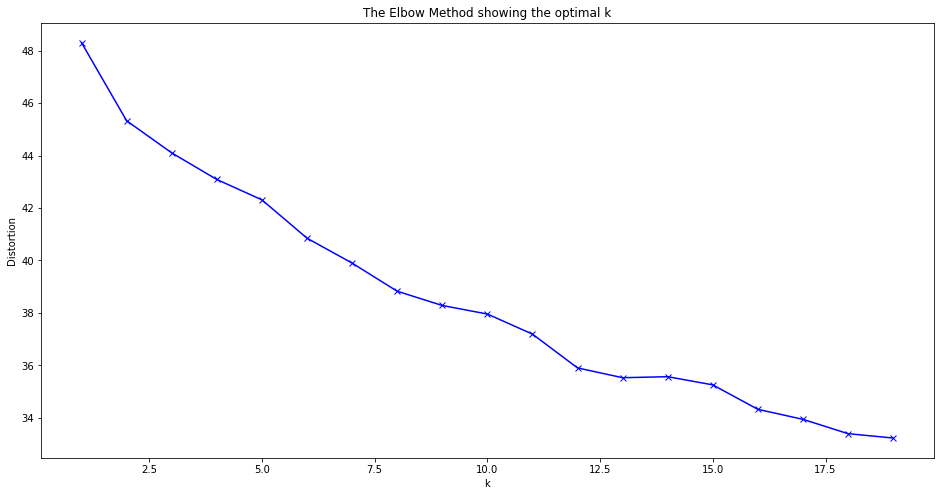

In [51]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

<B> The Silhouette Method </B>

In [56]:
from sklearn.metrics import silhouette_score
sil = []
kmax = 20

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(venues_grouped_clustering)
  labels = kmeans.labels_
  sil.append(silhouette_score(venues_grouped_clustering, labels, metric = 'euclidean'))

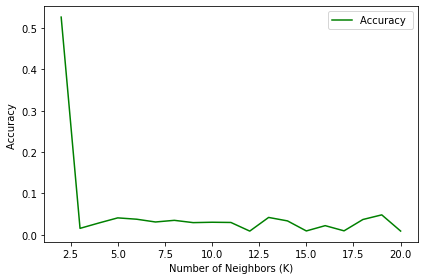

In [57]:
plt.plot(range(2,21),sil,'g')

plt.legend(('Accuracy ', '+/- 1xstsild','+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

In [42]:
sil

[0.47077701277824896,
 0.021786916935980793,
 0.2818116906780609,
 0.03755289076047122,
 0.253622929394336,
 0.023148337332609112,
 0.033254720607225584,
 0.04422143287532083,
 0.03212383470358653,
 0.03343876572741968,
 0.04637037549922594,
 0.03479135084348755,
 0.008654330006526538,
 0.024750433181237007,
 0.025563583382959783,
 0.015579146935071161,
 0.024760188880747762,
 0.030158229832600164,
 0.012252684560264418]

#### Elbow Method give us the optimal K = 5.  We'll use K=5 for clustering.

In [58]:
kclusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([3, 3, 3, 3, 3, 3, 0, 3, 0, 3])

In [60]:
# add clustering labels
#neighborhood_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


neighborhoods_clustered = cities_data

# merge neighborhood_venues_sorted with neighorhoods_clustered to add latitude/longitude for each neighborhood
neighborhoods_clustered = neighborhood_venues_sorted.join(cities_data.set_index(['Borough_City','Neighborhood']), on=['Borough_City','Neighborhood'])


neighborhoods_clustered


,Cluster Labels,Borough_City,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Latitude,Longitude
0,3,Bronx,Allerton,Pizza Place,Discount Store,Pharmacy,Supermarket,Spa,Deli / Bodega,Breakfast Spot,Fried Chicken Joint,Electronics Store,Grocery Store,40.865788,-73.859319
1,3,Bronx,Baychester,Donut Shop,Accessories Store,Convenience Store,Supermarket,Fried Chicken Joint,Spanish Restaurant,Gym / Fitness Center,Pet Store,Fast Food Restaurant,Shopping Mall,40.866858,-73.835798
2,3,Bronx,Bedford Park,Diner,Deli / Bodega,Pizza Place,Food Truck,Chinese Restaurant,Park,Sandwich Place,Spanish Restaurant,Mexican Restaurant,Donut Shop,40.870185,-73.885512
3,3,Bronx,Belmont,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Dessert Shop,Bank,Grocery Store,Mexican Restaurant,Fish Market,Bar,40.857277,-73.888452
4,3,Bronx,Bronxdale,Chinese Restaurant,Supermarket,Mexican Restaurant,Eastern European Restaurant,Pizza Place,Performing Arts Venue,Spanish Restaurant,Breakfast Spot,Gym,Bank,40.852723,-73.861726
5,3,Bronx,Castle Hill,Diner,Bank,Pharmacy,Pizza Place,Market,Bus Station,Peruvian Roast Chicken Joint,Perfume Shop,Persian Restaurant,Peruvian Restaurant,40.819014,-73.848027
6,0,Bronx,City Island,Thrift / Vintage Store,Deli / Bodega,Seafood Restaurant,Boat or Ferry,Arts & Crafts Store,Smoke Shop,History Museum,Harbor / Marina,Baseball Field,Bar,40.847247,-73.786488
7,3,Bronx,Claremont Village,Bus Station,Grocery Store,Deli / Bodega,Chinese Restaurant,Bakery,Pharmacy,Gym,Discount Store,Gift Shop,Liquor Store,40.831428,-73.901199
8,0,Bronx,Clason Point,Park,Boat or Ferry,Bus Stop,Scenic Lookout,Playground,Convenience Store,Pool,Grocery Store,South American Restaurant,Persian Restaurant,40.806551,-73.854144
9,3,Bronx,Co-op City,Bus Station,Trail,Fast Food Restaurant,Bagel Shop,Pizza Place,Park,Grocery Store,Donut Shop,Post Office,Discount Store,40.874294,-73.829939


In [61]:
#get New York City coordinates
address = 'New York, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude




manhattan_map = folium.Map(location=[latitude, longitude], zoom_start=10)


n=5 

# clusters on the map of Manhattan
# set color scheme for the clusters
x = np.arange(n)
ys = [i + x + (i*x)**2 for i in range(n)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(neighborhoods_clustered['Latitude'], neighborhoods_clustered['Longitude'],\
                                  neighborhoods_clustered['Neighborhood'], neighborhoods_clustered['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(manhattan_map)
manhattan_map

In [62]:
#get Philadelphia coordinates
address = 'Philadelphia, PA'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude




philly_map = folium.Map(location=[latitude, longitude], zoom_start=11)


n=5 

# clusters on the map of Manhattan
# set color scheme for the clusters
x = np.arange(n)
ys = [i + x + (i*x)**2 for i in range(n)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(neighborhoods_clustered['Latitude'], neighborhoods_clustered['Longitude'],\
                                  neighborhoods_clustered['Neighborhood'], neighborhoods_clustered['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(philly_map)
philly_map

We'll try to find similar neighbourhoods as Lexington Park Philadelphia in New York City.
Lexington Park belongs to clustr 4. We'll make filter the dataframe to get a list of neighborhoods that are in cluster 4.


In [63]:
cluster4 = neighborhoods_clustered[neighborhoods_clustered['Cluster Labels'] == 4]
cluster4

,Cluster Labels,Borough_City,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Latitude,Longitude
235,4,Philadelphia,Lexington Park,Park,Bar,Scenic Lookout,American Restaurant,Photography Studio,Pharmacy,Pet Store,Pet Service,Pet Café,Peruvian Roast Chicken Joint,40.050370,-75.041769
249,4,Philadelphia,"Mount Airy, West",Park,Scenic Lookout,Accessories Store,Pharmacy,Pet Store,Pet Service,Pet Café,Peruvian Roast Chicken Joint,Peruvian Restaurant,Persian Restaurant,40.043383,-75.207149
300,4,Philadelphia,West Park,Park,Martial Arts School,Accessories Store,Photography Studio,Pharmacy,Pet Store,Pet Service,Pet Café,Peruvian Roast Chicken Joint,Peruvian Restaurant,40.033490,-75.193602
386,4,Queens,Somerville,Park,Accessories Store,Piano Bar,Pharmacy,Pet Store,Pet Service,Pet Café,Peruvian Roast Chicken Joint,Peruvian Restaurant,Persian Restaurant,40.597711,-73.796648
453,4,Staten Island,Todt Hill,Park,Accessories Store,Piano Bar,Pharmacy,Pet Store,Pet Service,Pet Café,Peruvian Roast Chicken Joint,Peruvian Restaurant,Persian Restaurant,40.597069,-74.111329


There are 2 neighborhoods in New York City that are similar to Lexington Park in terms of most common venues. These are Somerville Queens and \
Todt Hill Staten Island.